In [2]:
!pip install tf-nightly-gpu-2.0-preview
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from collections import Counter
from skimage.color import rgb2lab, deltaE_cie76
from sklearn.cluster import KMeans

     |████████████████████████████████| 391.0MB 32kB/s 
     |████████████████████████████████| 3.8MB 45.2MB/s 
     |████████████████████████████████| 450kB 52.2MB/s 
Found GPU at: /device:GPU:0


In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
DATA_PATH='./gdrive/My Drive/Career Work/SERIUS/Pill Images V2/Test Set/Pill2'
medication_array=['Pill1','Pill2','Pill3','Pill4','Pill5','Pill6']
colour_array=['Red','Orange','White','Black','Dark Red','Blue']
shape=['Circular','Elliptical']
IMG_SIZE=250
x_train=[]

In [0]:
class accuracy:
  def __init__(self):
    self.total_image_count=0
    self.correct_image_count=0
    self.accuracy=0

In [0]:
def process_image(img_array,IMG_SIZE,pill_index,number_of_colours): 
  output_image_colour=[]
  crop_img = img_array[250:750, 700:1200] #first crop the image
  #length x width
  
  hsv = cv2.cvtColor(crop_img, cv2.COLOR_BGR2HSV) #convert image to hsv

  #split hsv into separate channels, use the apply otsu on the s channel in order to invert it
  h,s,v=cv2.split(hsv)
  retval2,thresh2 = cv2.threshold(s,125,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
  if retval2<10: #to account for otsu not being able to find two peaks to approximate a value under 
    new_array=cv2.resize(crop_img,(IMG_SIZE,IMG_SIZE))
    #pillAccuracy.correct_image_count+=1
    output_image_colour.append('White')
    return crop_img, output_image_colour #just return the original image of the white pill
  
  kernel = np.ones((5,5),np.uint8)
  
  #apply blurs
  blur = cv2.GaussianBlur(thresh2,(5,5),0) #Gaussian Blur gets rid of the noise from the image
  #print('Gaussian Blur')
  #cv2_imshow(blur)
  
  blur2 = cv2.bilateralFilter(blur,9,75,75) #bilaterial filter on top of that
  
  #print('Bilateral Filter')
  #cv2_imshow(blur2)
  closing = cv2.morphologyEx(blur2, cv2.MORPH_CLOSE, kernel) #smooths the image so contours are detected better
  
  #print('Closing')
  #cv2_imshow(closing)
  
  
  #cv2_imshow(closing)
  #find and draw contours
  _,contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  
  #cv2.drawContours(hsv,contours,-1,(0,0,255)) #draw contours (red circles in image)
  contour_area=cv2.contourArea(contours[0])

  
  #poor quality image if the contour is smaller than 200
  if contour_area<200:
    #set some boolean append variable in to false, then in process  image, do not append the image
    output_image_colour.append('White')
    return crop_img, output_image_colour
    
  #rectangles and crop
  rect=cv2.minAreaRect(contours[0])
  box=cv2.boxPoints(rect)
  box=np.int0(box) #convert all values of box into integers, same array
  #cv2.drawContours(hsv,[box],0,(0,255,0)) #draw green contours around the box to crop the image
  
  
  final_crop=crop_rect(hsv, rect) 
  rgb=show_RGB_from_HSV(final_crop)
  #rgb_bright=increase_image_brightness(rgb)
  #colours=get_colours(rgb_bright,2,True)
  
  #get HSV colours in a list
  colours=get_colours_hsv(final_crop,number_of_colours,True)
  # define colour ranges
  colour_definitions=define_colours_hsv()
  
  #this class will give you the colour ranges
  pillColour=my_colours_hsv(colours,3,colour_definitions)
  #pillColour=my_colours(colours,1,colour_definitions.singlePills,colour_definitions.blisterPills)
  output_image_colour=pillColour.image_colour
  temp=show_RGB_from_HSV(final_crop)
  #this line gives your final prediction
#   print(pillColour.image_colour)

#   if pillColour.index==pill_index:
#     pillAccuracy.correct_image_count+=1
    
  new_array=cv2.resize(final_crop,(IMG_SIZE,IMG_SIZE)) #resize array before moving forward
  return new_array, output_image_colour


In [0]:
def process_image_blister(img_array,IMG_SIZE): 
  crop_img=img_array[350:750,600:1300]
  #length x width
  
  hsv= cv2.cvtColor(crop_img, cv2.COLOR_BGR2HSV) #convert image to hsv
  #print('hsv')
  cv2_imshow(hsv)
  
  #split hsv into separate channels, use the apply otsu on the s channel in order to invert it
  h,s,v=cv2.split(hsv)
  retval2,thresh2 = cv2.threshold(s,125,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

  print('thresh2')
  cv2_imshow(thresh2)
  
  if retval2<10: #to account for otsu not being able to find two peaks to approximate a value under 
    new_array=cv2.resize(crop_img,(IMG_SIZE,IMG_SIZE))
    return crop_img #just return the original image of the white pill
  
  kernel = np.ones((5,5),np.uint8)
  
  #apply blurs
  blur = cv2.GaussianBlur(thresh2,(5,5),0) #Gaussian Blur gets rid of the noise from the image
  blur2 = cv2.bilateralFilter(blur,9,75,75) #bilaterial filter on top of that
  closing = cv2.morphologyEx(blur2, cv2.MORPH_CLOSE, kernel) #smooths the image so contours are detected better
  
  print('closing')
  cv2_imshow(closing)
  
  #find and draw contours
  _,contours, _ = cv2.findContours(closing, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)  
  #cv2.drawContours(hsv,contours,-1,(0,0,255)) #draw contours (red circles in image)
  contour_area=cv2.contourArea(contours[0])

  #poor quality image if the contour is smaller than 200
  if contour_area<200:
    #set some boolean append variable in to false, then in process  image, do not append the image
    return crop_img
    
  #rectangles and crop
  rect=cv2.minAreaRect(contours[0])
  box=cv2.boxPoints(rect)
  box=np.int0(box) #convert all values of box into integers, same array
  cv2.drawContours(hsv,[box],0,(255,0,0)) #draw green contours around the box to crop the image
  show_RGB_from_HSV(hsv)
  
  #cv2_imshow(thresh2)
  #print(rect)
  #crop image based on contours
  final_crop=crop_rect(hsv, rect) 
  new_array=cv2.resize(final_crop,(IMG_SIZE,IMG_SIZE)) #resize array before moving forward
  show_RGB_from_HSV(new_array)
  return new_array

In [0]:
def find_outer_rectangle(IMG_ARRAY,IMG_SIZE):
  hsv = cv2.cvtColor(IMG_ARRAY, cv2.COLOR_BGR2HSV) #convert image to hsv
  
  #split hsv into separate channels, use the apply otsu on the s channel in order to invert it
  h,s,v=cv2.split(hsv)
  retval2,thresh2 = cv2.threshold(s,125,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
  
  _,contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  
  cv2.drawContours(hsv,contours,-1,(0,0,255)) #draw contours (red circles in image)
  
  

TypeError: ignored

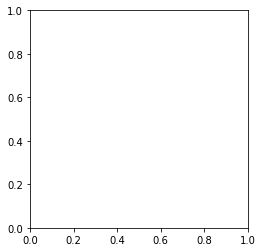

In [0]:
DATA_PATH2='./gdrive/My Drive/Career Work/SERIUS/Blister'

for image in os.listdir(DATA_PATH2):
  img_array=cv2.imread(os.path.join(DATA_PATH2,image))
  plt.imshow(img_array)
  #try:
  process_image_blister(img_array,IMG_SIZE)
  #except:
    #print('f')
    #break


In [0]:

def crop_rect(img, rect):
    # get the parameter of the small rectangle
    center, size, angle = rect[0], rect[1], rect[2]
    #print("my rect", rect)
    center, size = tuple(map(int, center)), tuple(map(int, size)) #convert each cooordinate to integers and then convert into tuples
    #print(center," + ",size, " + ", angle)
    # get row and col num in img
    height, width = img.shape[0], img.shape[1]

    # calculate the rotation matrix
    M = cv2.getRotationMatrix2D(center, angle, 1)
    
    # rotate the original image relative to the rectangle
    img_rot = cv2.warpAffine(img, M, (width, height))

    # now rotated rectangle becomes vertical and we crop it
    img_crop = cv2.getRectSubPix(img_rot, size, center)

    return img_crop


In [0]:
def show_RGB_from_HSV(image_in):
  bgrimg = cv2.cvtColor(image_in, cv2.COLOR_HSV2BGR)
  cv2_imshow(bgrimg)
  #brgimg=increase_image_brightness(bgrimg)
  image = cv2.cvtColor(bgrimg, cv2.COLOR_BGR2RGB)
  pixels = np.array(image)
  #plt.imshow(pixels)
  #plt.show()
  return pixels

In [0]:
def RGB2HEX(rgb):
  return "#{:02x}{:02x}{:02x}".format(int(rgb[0]), int(rgb[1]), int(rgb[2]))

In [0]:
def HSV_REGULARIZED(hsv): 
  hsv_reg=[[0 for x in range(3)] for y in range(len(hsv))]
  
  for i in range(len(hsv)):
    hsv_reg[i][0]=2*hsv[i][0]
    hsv_reg[i][1]=hsv[i][1]*100/255
    hsv_reg[i][2]=hsv[i][2]*100/255
    
  return hsv_reg

In [0]:
def increase_image_brightness(image):
  alpha=1.5
  beta=1
  new_image = np.zeros(image.shape, image.dtype)
  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
        for c in range(image.shape[2]):
            new_image[y,x,c] = np.clip(alpha*image[y,x,c] + beta, 0, 255)
  #cv2_imshow(image)
  #cv2_imshow(new_image)
  return new_image

Following cell gets colours from the image using Kmeans clustering

In [0]:
def get_colours(rgb_img,number_of_colours,show_chart):
  #cv2_imshow(rgb_img)
  rgb_img = rgb_img.reshape(rgb_img.shape[0]*rgb_img.shape[1], 3) #must be 2 dimensional
  clf = KMeans(n_clusters = number_of_colours)
  labels = clf.fit_predict(rgb_img)
  #print('labels',labels)
  counts=Counter(labels) #keeps track of how many times equivalent values are added
 # print('counts',counts) #
 # print('keys',counts.keys())
  
  center_colors = clf.cluster_centers_
 # print('center colors',center_colors)
  ordered_colors = [center_colors[i] for i in counts.keys()] 
 # print('ordered',ordered_colors)
  hex_colors = [RGB2HEX(ordered_colors[i]) for i in counts.keys()]
  #print('hex',hex_colors)
  rgb_colors = [ordered_colors[i] for i in counts.keys()]
  
#   if (show_chart):
#       plt.figure(figsize = (8, 6))
#       plt.pie(counts.values(), labels = hex_colors, colors = hex_colors)

  return rgb_colors

In [0]:
def get_colours_hsv(hsv_img,number_of_colours,show_chart):
  #cv2_imshow(rgb_img)
  hsv = hsv_img.reshape(hsv_img.shape[0]*hsv_img.shape[1], 3) #must be 2 dimensional
  clf = KMeans(n_clusters = number_of_colours)
  labels = clf.fit_predict(hsv)
  #print('labels',labels)
  counts=Counter(labels) #keeps track of how many times equivalent values are added
 # print('counts',counts) #
 # print('keys',counts.keys())
  
  center_colors = clf.cluster_centers_
 # print('center colors',center_colors)
  ordered_colors = [center_colors[i] for i in counts.keys()] 
  
 # print('ordered',ordered_colors
  hsv_colors = [ordered_colors[i] for i in counts.keys()]
  #print(hsv_colors)
  
  #normalize hsv to match standard HSV values 
  hsv_reg=HSV_REGULARIZED(hsv_colors)
#   if (show_chart):
#       plt.figure(figsize = (8, 6))
#       plt.pie(counts.values(), labels = hex_colors, colors = hex_colors)

  return hsv_reg

In [0]:
class pill_colour:
  def __init__(self,name_of_colour,hsv_values):
    self.name_of_colour=name_of_colour
    self.HSV_values=hsv_values


In [0]:
class define_colours:
  
  #create list of pills
  def create_pill_arrays(self):
    #one list of blisterPills and one array of singlePills
    self.blisterPills=[pill_colour(self.colour_array[i],self.colours_blister[i]) for i in range(len(self.colour_array))]
    self.singlePills=[pill_colour(self.colour_array[i],self.colours_single[i]) for i in range(len(self.colour_array))]
    #don't need ^ for hsv
    
  def newPill(self,isBlister,name_of_colour,RGB_colours):
    #create a new pill from parameters entered by the user and get_colours from the image, append it to our list
    new_pill_colour=pill_colour(name_of_colour,RGB_colours)
    
    if isBlister:
      self.blisterPills.append(new_pill_colour)
    else:
      self.singlePills.append(new_pill_colour)
      
  def deletePill(self,isBlister,pill):
    try:
      if isBlister:
        self.blisterPills.remove(pill)
      else:
        self.singlePills.remove(pill)
    except:
      print('Pill Not Found')
  
  def __init__(self):
    self.colours_blister=[[190,130,90],[210,170,111],[0,0,0],[77,51,42],[100,70,65],[150,95,95]] #range of values here (insert later)
    self.colours_single=[[200,100,40],[240,190,105],[0,0,0],[77,45,35],[105,61,47],[160,70,80]]
    
    self.colour_array=['Red','Orange','White','Brown','Red and Yellow','Dark Red']
    self.create_pill_arrays()

In [0]:
class define_colours_hsv:
  
  def newPill(self,name_of_colour,image):
    #create a new pill from parameters entered by the user and get_colours from the image, append it to our list
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    HSV_colours=get_colours_hsv(hsv_image,3,True)
    
    new_pill_colours=pill_colour(name_of_colour,HSV_colours)
    
    #update colour_dictionary_hue
    if new_pill_colours not in self.all_pills_hsv and new_pill_colours[0] not in self.colour_dictionary_hue.keys():
      self.all_pills_hsv.append(new_pill_colours) #append to array
      self.colour_dictionary_hue.update({HSV_colours[0]:name_of_colour}) #adds this key value pair to dicitonary
    else:
      print('Pill Already added')
  def deletePill(self,pill):
    try:
      self.all_pills_hsv.remove(pill)
      del self.colour_dictionary_hue[pill.HSV_values[0]] #deletes this key from dictionary
    except:
      print('Pill Not Found')
  
  def __init__(self):
    self.all_pills_hsv=[]
    self.colour_dictionary_hue={23:'Dark Orange',
                                35:'Light Orange',
                                346:'Pink'}
    
    #this is only used for testing accuracy
    self.colour_array=['Light Orange','Dark Orange','White','Brown','Brown and Orange','Pink']

In [0]:
#separate this class into two: one that defines the pill colours and one that checks so it doesn't redefine the colours every time

class my_colours:
  
  def findImage(self,image_colors,Pills,isBlister):
    #print('color:',image_colors)
    #print(range(len(Pills)))
    for i in range(len(Pills)): #loop through 6 colours
      selected_color = rgb2lab(np.uint8(np.asarray([[Pills[i].RGB_colours]])))
      #print(self.colour_array[i],' single',selected_color,' blister', selected_color)
      for j in range(self.number_of_colors): #check each of the colours we found on the screen
        curr_color = rgb2lab(np.uint8(np.asarray([[image_colors[j]]])))
        diff = deltaE_cie76(selected_color, curr_color)
        
        if abs(diff) < self.threshold:
          
          self.image_colour=Pills[i].name_of_colour
          self.index=i
          self.isBlister=isBlister
          return True
    return False
    
  def withinBounds(self,image_colors,singlePills,blisterPills):
    image_match = self.findImage(image_colors,singlePills,False) or self.findImage(image_colors,blisterPills,True)
          
    return image_match
          
  def __init__(self,rgb_colors,num_colours, single, blister):
#     self.blister_bounds=self.colours_blister[i]
#     self.single_bounds=self.colours_single[i]
    self.threshold=8
    self.image_colour=None
    self.number_of_colors=num_colours
    self.index=100000
    self.within_bounds=self.withinBounds(rgb_colors,single,blister)
         
  #define the upper and lower bounds for each color
  #returns true

In [0]:
#HSV Version of This:
class my_colours_hsv:
  
  def identifyColour(self,hsv_colours,colour_definition):
    #print('color:',image_colors)
    #print(range(len(Pills)))
    greyCount=0
    found=False
    for j in range(self.number_of_colors): #check each of the colours we found on the screen compare each
      extracted_colour = hsv_colours[j]
      extracted_h=extracted_colour[0]
      extracted_s=extracted_colour[1]
      extracted_v=extracted_colour[2]
      
    #If saturation is under 25, it is the gray colour around the pill, discard colour, continue
      if extracted_s<=25:
        greyCount+=1
        continue #continue moves on to the next colour we are extracting
        
    #If the V is under 20 it is a darker colour, classify as Dark Brown
      elif extracted_v<=29:
        print('Dark Colour')
        self.addColour('Brown')
        continue        
      
      #now loop through the H's to see if they match
      for i in colour_definition.colour_dictionary_hue: #loop through all the already defined h's in the dictionary
        selected_hue = i
        print(i)
        
        # H within 5 of 23, classify as orange
        # H within 5 of 35, classify as light orange
        # H within 5 of 340 classify as Pink
        diff=selected_hue-extracted_h

        if abs(diff) < self.threshold:
          #add the string that is in colour dictionary 
          self.addColour(colour_definition.colour_dictionary_hue[i])
          found=True
          break
          
    #if empty, we have not found a colour or discarded 
    if not self.image_colour and greyCount==self.number_of_colors:
      self.image_colour.append('White')
        
    return found
  
  def addColour(self,colour_to_add):
    #if the colour is not already in the image_colour array, append colour to add
    if colour_to_add not in self.image_colour:
      self.image_colour.append(colour_to_add)
          
        
  #hsv_colours
  def __init__(self,hsv_colours,num_colours,definitions):
#     self.blister_bounds=self.colours_blister[i]
#     self.single_bounds=self.colours_single[i]
    self.threshold=8
    self.image_colour=[] #list of all the colours in the photographed image
    self.number_of_colors=num_colours
    self.index=100000
    self.within_bounds=self.identifyColour(hsv_colours,definitions)
         
  #define the upper and lower bounds for each color
  #returns true

In [0]:
import collections
def colour_correct(image_colours,index):
  correct_array=[['Dark Orange'],['Light Orange'],['White'],['Brown'],['Brown','Light Orange'],['Pink']]
  array=correct_array[index]
  if collections.Counter(array) == collections.Counter(image_colours):
    return True
  
  #exceptions below
  if index==4:
    if collections.Counter(array)==collections.Counter(['Brown','Dark Orange']):
      return True
    
  if index==0:
    if collections.Counter(array)==collections.Counter(['Brown','Light Orange']):
      return True
    
  return False

* **Hue**: the actual colour
* **Saturation**: less saturation, more gray
* **Value**: how strong the colour is (brightness)


Pill1


23


colour array:  ['Dark Orange']
correct


23
35
346
23
35
346


colour array:  []
incorrect


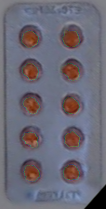

23


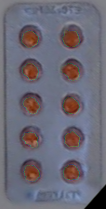

colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23
23
35
346


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23
35
346


colour array:  []
incorrect


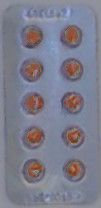

23


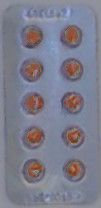

colour array:  ['Dark Orange']
correct


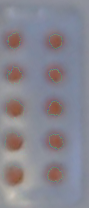

23


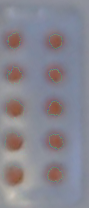

colour array:  ['Dark Orange']
correct


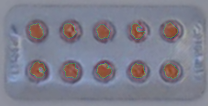

23


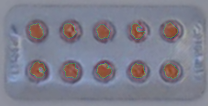

colour array:  ['Dark Orange']
correct


23
35
346


colour array:  []
incorrect


23
35
346


colour array:  []
incorrect
colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
correct


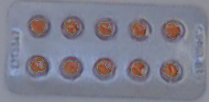

23


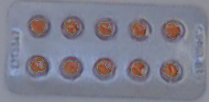

colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct
colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct
colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
correct
colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23
35
346


colour array:  []
incorrect


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23
23
35
346


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct
colour array:  ['White']
incorrect


23
23


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23
23
35
346


colour array:  ['Dark Orange']
correct


23
23
35
346


colour array:  ['Dark Orange']
correct


23
23
35


colour array:  ['Dark Orange', 'Light Orange']
incorrect


23
23


colour array:  ['Dark Orange']
correct


colour array:  ['White']
incorrect


23
23
35


colour array:  ['Dark Orange', 'Light Orange']
incorrect


23
23
35
346


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23
23
35
346


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23
35
23


colour array:  ['Light Orange', 'Dark Orange']
incorrect


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


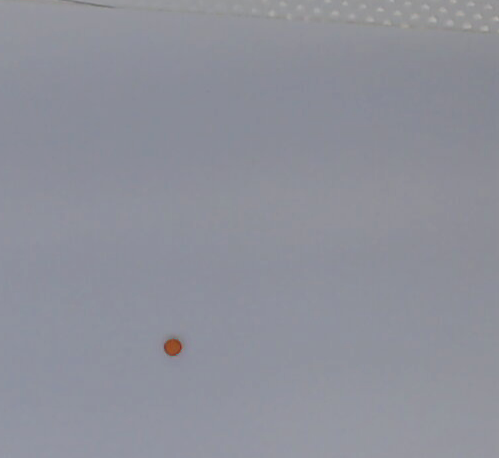

23


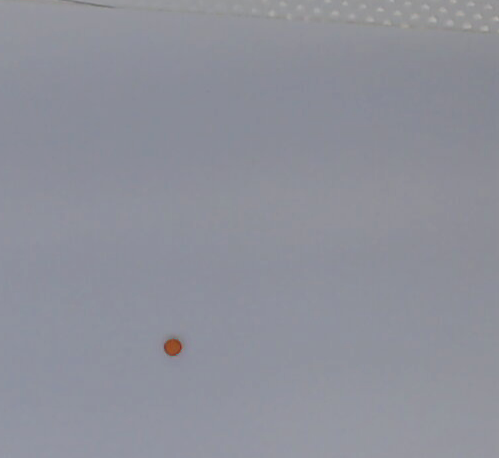

colour array:  ['Dark Orange']
correct


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


23
23


colour array:  ['Dark Orange']
correct


23
23
35
346


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct
colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


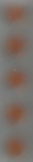

23


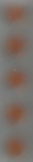

colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23
35
346


colour array:  []
incorrect


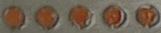

23
23


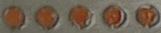

colour array:  ['Dark Orange']
correct
colour array:  ['White']
incorrect


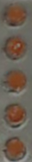

23
23


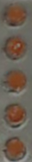

colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23
23
35


colour array:  ['Dark Orange', 'Light Orange']
incorrect


23
35
346


colour array:  []
incorrect


23


colour array:  ['Dark Orange']
correct


23
35
346


colour array:  []
incorrect


23
23
35


colour array:  ['Dark Orange', 'Light Orange']
incorrect


23
35
346


colour array:  []
incorrect


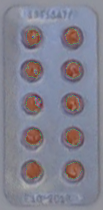

23


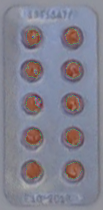

colour array:  ['Dark Orange']
correct


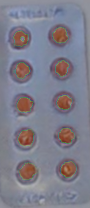

23


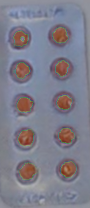

colour array:  ['Dark Orange']
correct


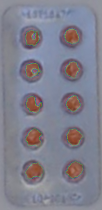

23


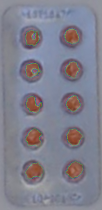

colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23
23
35
346


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23
23


colour array:  ['Dark Orange']
correct


23
23
35


colour array:  ['Dark Orange', 'Light Orange']
incorrect


23
35
346
23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct
colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
correct


23
23
35
346


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
correct


23
35
346
23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct


23


colour array:  ['Dark Orange']
correct
correct count:  151
total count:  185
accuracy: 81.62162162162161 %
Pill2


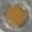

23
35
23
35


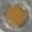

colour array:  ['Light Orange']
correct


23
35
23
35


colour array:  ['Light Orange']
correct


23
35
23
35


colour array:  ['Light Orange']
correct


23
35
23
35


colour array:  ['Light Orange']
correct


23
35
23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23


colour array:  ['Dark Orange']
incorrect


23
23


colour array:  ['Dark Orange']
incorrect


23
35
23
35


colour array:  ['Light Orange']
correct


23
35
23
35


colour array:  ['Light Orange']
correct


23


colour array:  ['Dark Orange']
incorrect


23


colour array:  ['Dark Orange']
incorrect


23
35
23
35


colour array:  ['Light Orange']
correct


23


colour array:  ['Dark Orange']
incorrect


23
35
23
35


colour array:  ['Light Orange']
correct


23
35
23
35


colour array:  ['Light Orange']
correct


23
23
35


colour array:  ['Dark Orange', 'Light Orange']
incorrect


23
35
23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35
23
35


colour array:  ['Light Orange']
correct
colour array:  ['White']
incorrect


23
35
23
35


colour array:  ['Light Orange']
correct


colour array:  ['White']
incorrect


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


colour array:  ['White']
incorrect


23
35


colour array:  ['Light Orange']
correct


23


colour array:  ['Dark Orange']
incorrect


23
35


colour array:  ['Light Orange']
correct


23


colour array:  ['Dark Orange']
incorrect


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35
23


colour array:  ['Light Orange', 'Dark Orange']
incorrect


23


colour array:  ['Dark Orange']
incorrect


23


colour array:  ['Dark Orange']
incorrect


23
23
35


colour array:  ['Dark Orange', 'Light Orange']
incorrect


23
35
23
35


colour array:  ['Light Orange']
correct


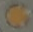

23
35
23
35


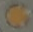

colour array:  ['Light Orange']
correct


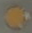

23
35
23
35


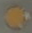

colour array:  ['Light Orange']
correct


23
35
23
35


colour array:  ['Light Orange']
correct


23
35
23


colour array:  ['Light Orange', 'Dark Orange']
incorrect


23
35
23
35
346


colour array:  ['Light Orange']
correct


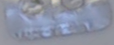

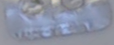

colour array:  ['White']
incorrect


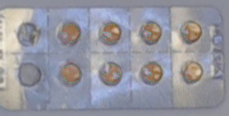

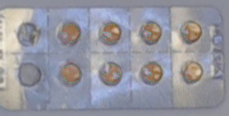

colour array:  ['White']
incorrect


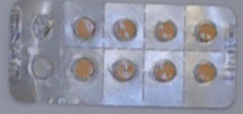

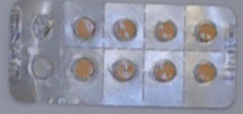

colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


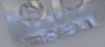

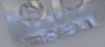

colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


23
35
23


colour array:  ['Light Orange', 'Dark Orange']
incorrect


23
35
23


colour array:  ['Light Orange', 'Dark Orange']
incorrect


23
35


colour array:  ['Light Orange']
correct


23
35
23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


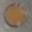

23
23
35


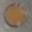

colour array:  ['Dark Orange', 'Light Orange']
incorrect


23
35
23


colour array:  ['Light Orange', 'Dark Orange']
incorrect


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


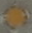

23
35
23
35


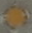

colour array:  ['Light Orange']
correct


23
35
23
35


colour array:  ['Light Orange']
correct
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


23
35
23
35


colour array:  ['Light Orange']
correct
colour array:  ['White']
incorrect


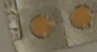

23
35
23
35
346


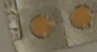

colour array:  ['Light Orange']
correct


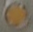

23
35
23
35


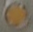

colour array:  ['Light Orange']
correct
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


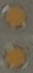

23
35
23
35


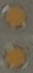

colour array:  ['Light Orange']
correct
colour array:  ['White']
incorrect


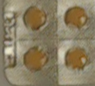

23
35
346
23
35


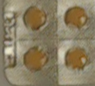

colour array:  ['Light Orange']
correct


23


colour array:  ['Dark Orange']
incorrect


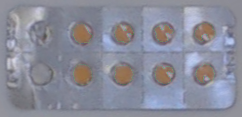

23


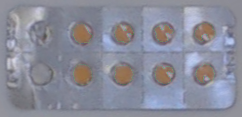

colour array:  ['Dark Orange']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


23
35


colour array:  ['Light Orange']
correct


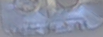

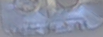

colour array:  ['White']
incorrect


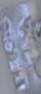

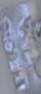

colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
incorrect


23


colour array:  ['Dark Orange']
incorrect
colour array:  ['White']
incorrect


23


colour array:  ['Dark Orange']
incorrect


23


colour array:  ['Dark Orange']
incorrect


23


colour array:  ['Dark Orange']
incorrect


23
35


colour array:  ['Light Orange']
correct


colour array:  ['White']
incorrect


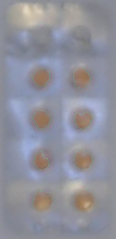

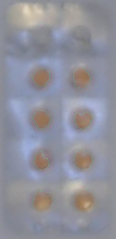

colour array:  ['White']
incorrect


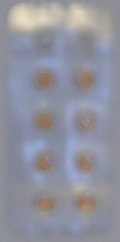

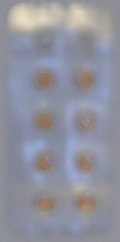

colour array:  ['White']
incorrect


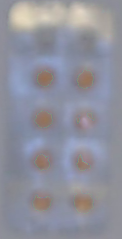

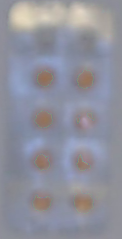

colour array:  ['White']
incorrect


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


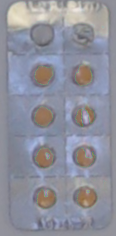

23
35


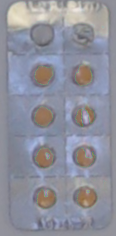

colour array:  ['Light Orange']
correct
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


23
35


colour array:  ['Light Orange']
correct
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


23
35


colour array:  ['Light Orange']
correct


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct


23
35


colour array:  ['Light Orange']
correct
correct count:  98
total count:  172
accuracy: 56.97674418604651 %
Pill3
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct


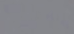

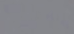

colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct


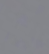

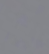

colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


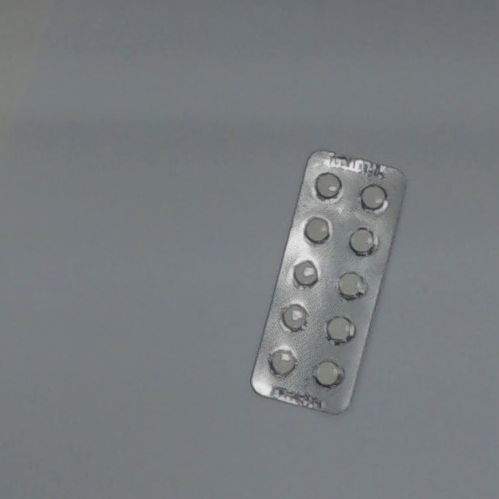

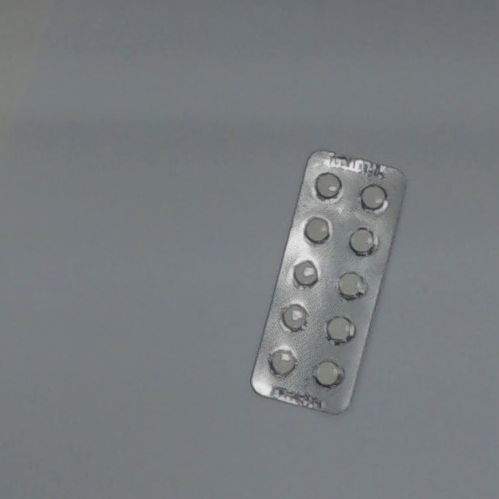

colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


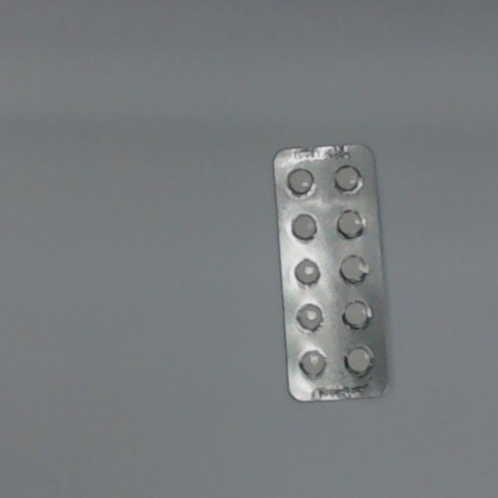

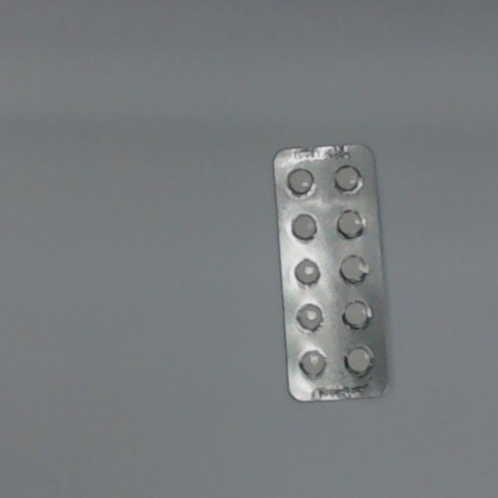

colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct


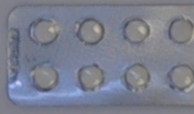

23
35
346


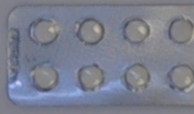

colour array:  []
incorrect


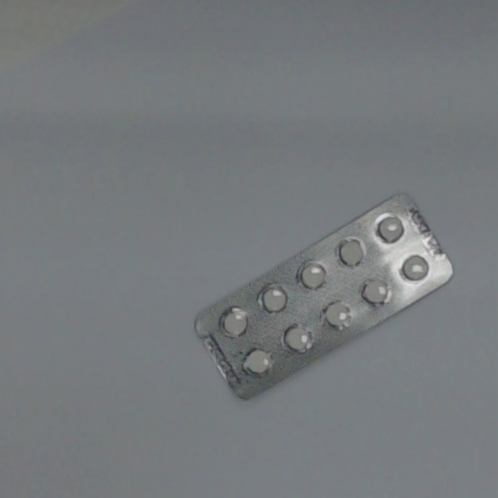

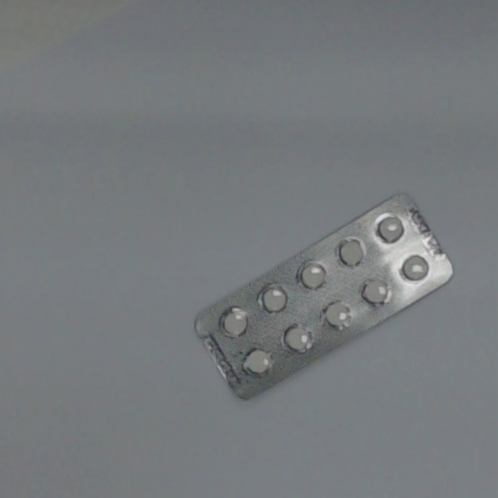

colour array:  ['White']
correct


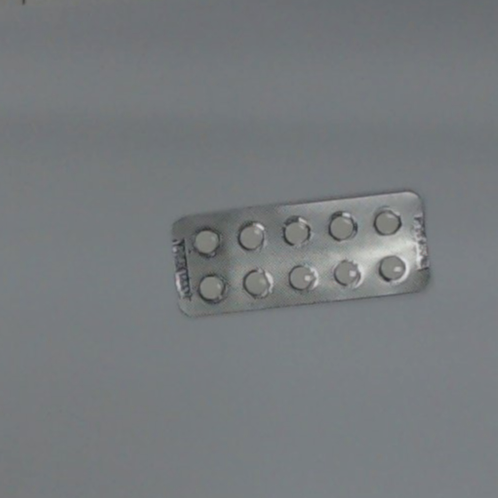

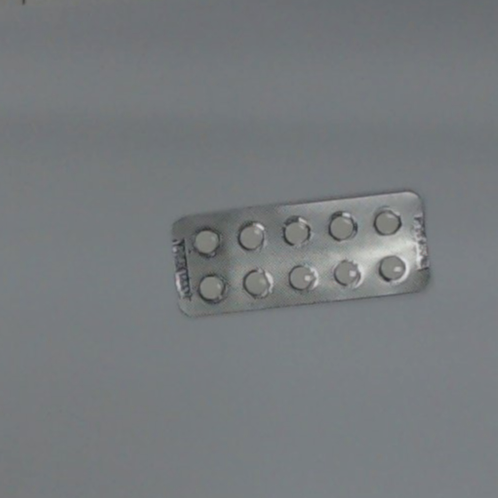

colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct


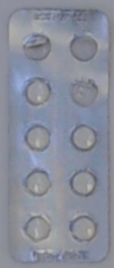

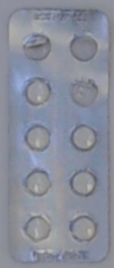

colour array:  ['White']
correct


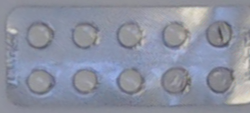

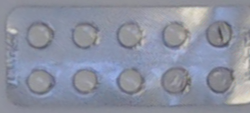

colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct


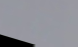

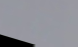

colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct


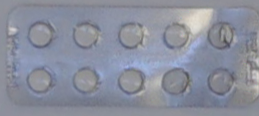

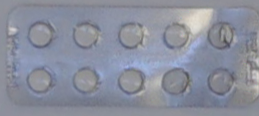

colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct


colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour array:  ['White']
correct
colour arr

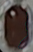

Dark Colour


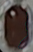

colour array:  ['Brown']
correct


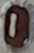

Dark Colour


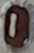

colour array:  ['Brown']
correct


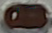

Dark Colour


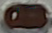

colour array:  ['Brown']
correct


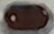

Dark Colour


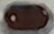

colour array:  ['Brown']
correct


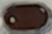

Dark Colour


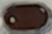

colour array:  ['Brown']
correct


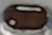

Dark Colour


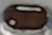

colour array:  ['Brown']
correct


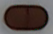

Dark Colour


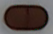

colour array:  ['Brown']
correct


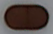

Dark Colour


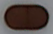

colour array:  ['Brown']
correct


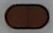

Dark Colour


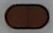

colour array:  ['Brown']
correct


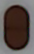

Dark Colour


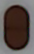

colour array:  ['Brown']
correct


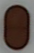

Dark Colour


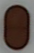

colour array:  ['Brown']
correct


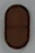

Dark Colour


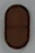

colour array:  ['Brown']
correct


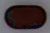

Dark Colour
Dark Colour


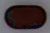

colour array:  ['Brown']
correct


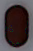

Dark Colour
Dark Colour


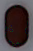

colour array:  ['Brown']
correct


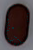

Dark Colour
Dark Colour


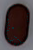

colour array:  ['Brown']
correct


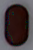

Dark Colour
Dark Colour


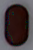

colour array:  ['Brown']
correct


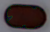

Dark Colour
Dark Colour


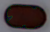

colour array:  ['Brown']
correct


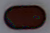

Dark Colour
Dark Colour


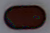

colour array:  ['Brown']
correct


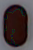

Dark Colour
Dark Colour


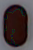

colour array:  ['Brown']
correct


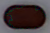

Dark Colour
Dark Colour


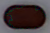

colour array:  ['Brown']
correct


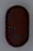

Dark Colour
Dark Colour


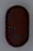

colour array:  ['Brown']
correct


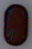

Dark Colour
Dark Colour


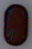

colour array:  ['Brown']
correct


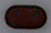

Dark Colour
Dark Colour


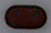

colour array:  ['Brown']
correct


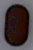

Dark Colour
Dark Colour


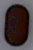

colour array:  ['Brown']
correct


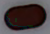

Dark Colour
Dark Colour


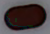

colour array:  ['Brown']
correct


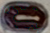

23
35
346
Dark Colour


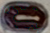

colour array:  ['Brown']
correct


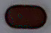

Dark Colour
Dark Colour


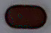

colour array:  ['Brown']
correct


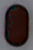

Dark Colour
Dark Colour


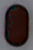

colour array:  ['Brown']
correct


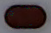

Dark Colour
Dark Colour


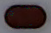

colour array:  ['Brown']
correct


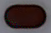

Dark Colour
Dark Colour


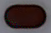

colour array:  ['Brown']
correct


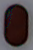

Dark Colour
Dark Colour


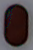

colour array:  ['Brown']
correct


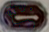

Dark Colour
23
35
346


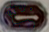

colour array:  ['Brown']
correct


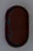

Dark Colour
Dark Colour


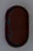

colour array:  ['Brown']
correct


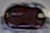

Dark Colour
Dark Colour


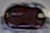

colour array:  ['Brown']
correct


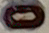

Dark Colour
Dark Colour


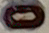

colour array:  ['Brown']
correct


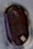

Dark Colour
Dark Colour


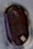

colour array:  ['Brown']
correct


Dark Colour
Dark Colour


colour array:  ['Brown']
correct


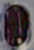

Dark Colour
Dark Colour


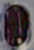

colour array:  ['Brown']
correct


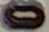

Dark Colour
Dark Colour


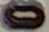

colour array:  ['Brown']
correct


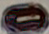

Dark Colour
Dark Colour


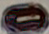

colour array:  ['Brown']
correct


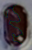

Dark Colour
Dark Colour


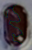

colour array:  ['Brown']
correct


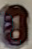

Dark Colour
Dark Colour


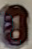

colour array:  ['Brown']
correct


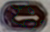

Dark Colour


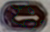

colour array:  ['Brown']
correct


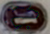

Dark Colour


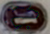

colour array:  ['Brown']
correct


Dark Colour
Dark Colour


colour array:  ['Brown']
correct


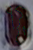

Dark Colour
Dark Colour


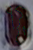

colour array:  ['Brown']
correct


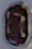

Dark Colour
Dark Colour


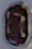

colour array:  ['Brown']
correct


Dark Colour


colour array:  ['Brown']
correct


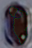

Dark Colour
Dark Colour


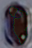

colour array:  ['Brown']
correct


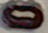

Dark Colour
Dark Colour


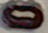

colour array:  ['Brown']
correct


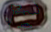

23
35
346
Dark Colour


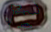

colour array:  ['Brown']
correct


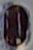

Dark Colour


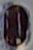

colour array:  ['Brown']
correct


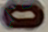

23
35
346
Dark Colour


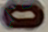

colour array:  ['Brown']
correct


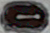

Dark Colour
Dark Colour


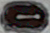

colour array:  ['Brown']
correct


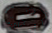

Dark Colour


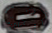

colour array:  ['Brown']
correct


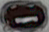

Dark Colour


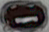

colour array:  ['Brown']
correct


Dark Colour


colour array:  ['Brown']
correct


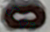

Dark Colour


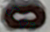

colour array:  ['Brown']
correct


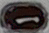

Dark Colour


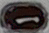

colour array:  ['Brown']
correct


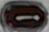

Dark Colour


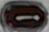

colour array:  ['Brown']
correct


Dark Colour


colour array:  ['Brown']
correct


Dark Colour
23


colour array:  ['Brown', 'Dark Orange']
incorrect


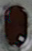

Dark Colour


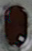

colour array:  ['Brown']
correct


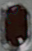

Dark Colour


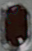

colour array:  ['Brown']
correct


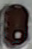

Dark Colour


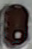

colour array:  ['Brown']
correct


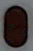

Dark Colour


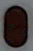

colour array:  ['Brown']
correct


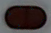

Dark Colour


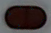

colour array:  ['Brown']
correct


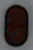

Dark Colour
Dark Colour


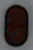

colour array:  ['Brown']
correct


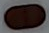

Dark Colour


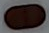

colour array:  ['Brown']
correct


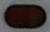

Dark Colour


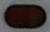

colour array:  ['Brown']
correct


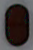

Dark Colour
Dark Colour


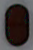

colour array:  ['Brown']
correct


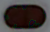

Dark Colour
Dark Colour


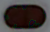

colour array:  ['Brown']
correct


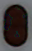

Dark Colour
Dark Colour


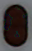

colour array:  ['Brown']
correct


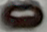

Dark Colour


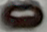

colour array:  ['Brown']
correct


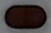

Dark Colour


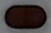

colour array:  ['Brown']
correct


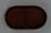

Dark Colour


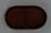

colour array:  ['Brown']
correct


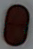

Dark Colour


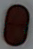

colour array:  ['Brown']
correct


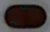

Dark Colour


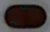

colour array:  ['Brown']
correct


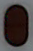

Dark Colour


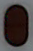

colour array:  ['Brown']
correct


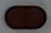

Dark Colour


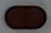

colour array:  ['Brown']
correct


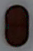

Dark Colour


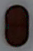

colour array:  ['Brown']
correct


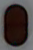

Dark Colour


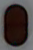

colour array:  ['Brown']
correct


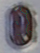

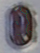

colour array:  ['White']
incorrect


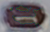

Dark Colour


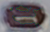

colour array:  ['Brown']
correct


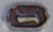

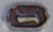

colour array:  ['White']
incorrect


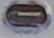

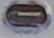

colour array:  ['White']
incorrect


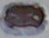

Dark Colour


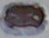

colour array:  ['Brown']
correct
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


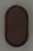

Dark Colour


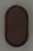

colour array:  ['Brown']
correct


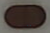

Dark Colour


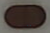

colour array:  ['Brown']
correct


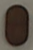

Dark Colour
Dark Colour


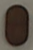

colour array:  ['Brown']
correct


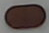

Dark Colour


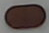

colour array:  ['Brown']
correct


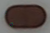

Dark Colour


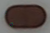

colour array:  ['Brown']
correct


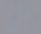

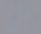

colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


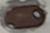

Dark Colour


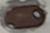

colour array:  ['Brown']
correct


Dark Colour


colour array:  ['Brown']
correct


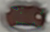

Dark Colour


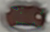

colour array:  ['Brown']
correct


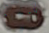

Dark Colour


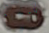

colour array:  ['Brown']
correct


Dark Colour
Dark Colour


colour array:  ['Brown']
correct


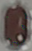

Dark Colour


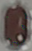

colour array:  ['Brown']
correct


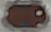

Dark Colour


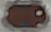

colour array:  ['Brown']
correct


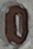

Dark Colour


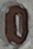

colour array:  ['Brown']
correct


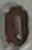

Dark Colour


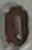

colour array:  ['Brown']
correct
colour array:  ['White']
incorrect


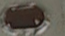

Dark Colour


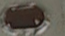

colour array:  ['Brown']
correct


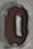

Dark Colour


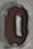

colour array:  ['Brown']
correct


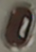

Dark Colour


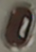

colour array:  ['Brown']
correct


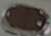

Dark Colour


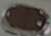

colour array:  ['Brown']
correct


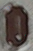

Dark Colour


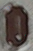

colour array:  ['Brown']
correct


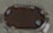

Dark Colour


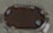

colour array:  ['Brown']
correct


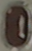

Dark Colour


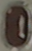

colour array:  ['Brown']
correct


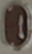

Dark Colour


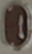

colour array:  ['Brown']
correct


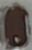

Dark Colour


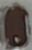

colour array:  ['Brown']
correct
colour array:  ['White']
incorrect


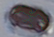

Dark Colour


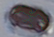

colour array:  ['Brown']
correct


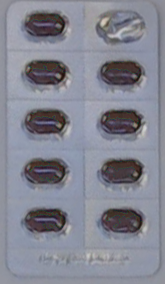

Dark Colour


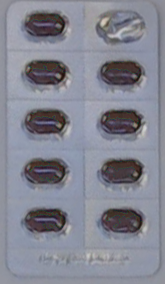

colour array:  ['Brown']
correct


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


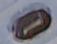

23
35


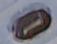

colour array:  ['Light Orange']
incorrect


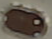

Dark Colour


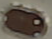

colour array:  ['Brown']
correct


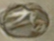

23
35
346


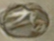

colour array:  []
incorrect


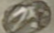

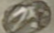

colour array:  ['White']
incorrect


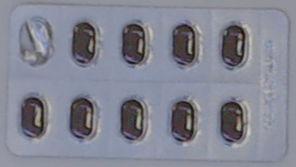

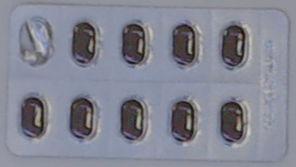

colour array:  ['White']
incorrect


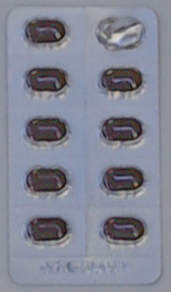

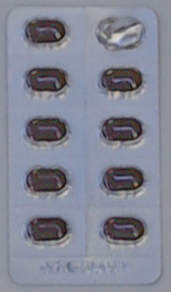

colour array:  ['White']
incorrect


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


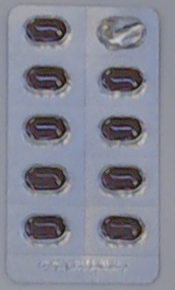

23
35
346


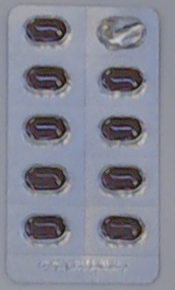

colour array:  []
incorrect


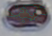

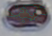

colour array:  ['White']
incorrect


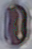

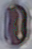

colour array:  ['White']
incorrect


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


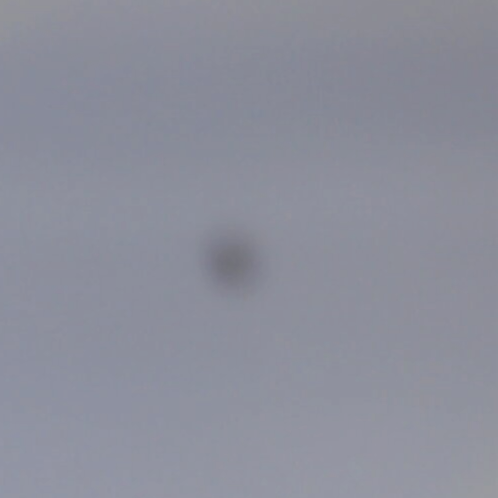

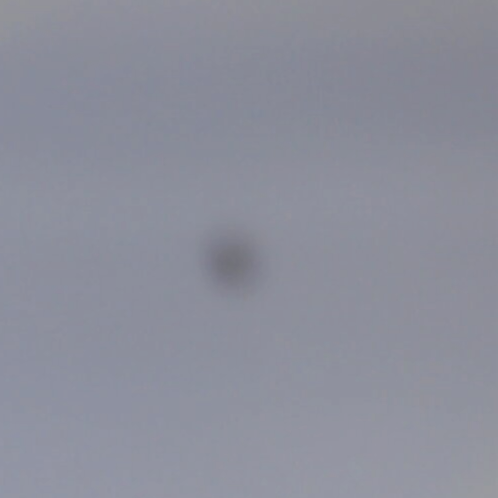

colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


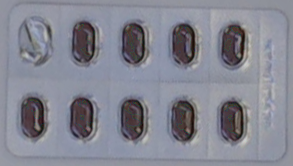

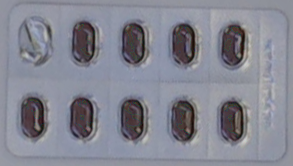

colour array:  ['White']
incorrect


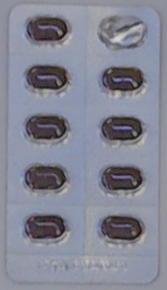

23
35
346


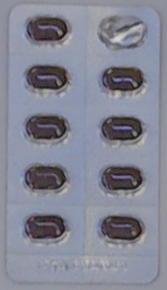

colour array:  []
incorrect
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


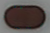

Dark Colour


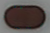

colour array:  ['Brown']
correct


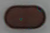

Dark Colour


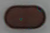

colour array:  ['Brown']
correct


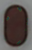

Dark Colour


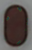

colour array:  ['Brown']
correct


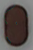

Dark Colour


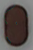

colour array:  ['Brown']
correct


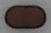

Dark Colour


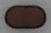

colour array:  ['Brown']
correct


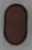

Dark Colour


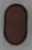

colour array:  ['Brown']
correct


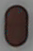

Dark Colour


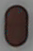

colour array:  ['Brown']
correct


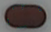

Dark Colour


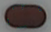

colour array:  ['Brown']
correct


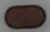

Dark Colour


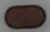

colour array:  ['Brown']
correct


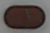

Dark Colour


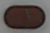

colour array:  ['Brown']
correct


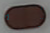

Dark Colour


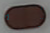

colour array:  ['Brown']
correct


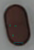

Dark Colour


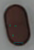

colour array:  ['Brown']
correct


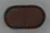

Dark Colour


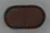

colour array:  ['Brown']
correct


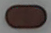

Dark Colour


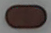

colour array:  ['Brown']
correct


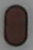

Dark Colour


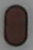

colour array:  ['Brown']
correct


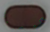

Dark Colour


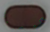

colour array:  ['Brown']
correct


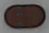

Dark Colour


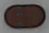

colour array:  ['Brown']
correct


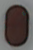

Dark Colour


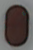

colour array:  ['Brown']
correct


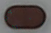

Dark Colour


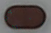

colour array:  ['Brown']
correct
correct count:  128
total count:  189
accuracy: 67.72486772486772 %
Pill5


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


23
Dark Colour


colour array:  ['Dark Orange', 'Brown']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour


colour array:  ['Brown']
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


23
Dark Colour


colour array:  ['Dark Orange', 'Brown']
incorrect


23
Dark Colour


colour array:  ['Dark Orange', 'Brown']
incorrect


23
Dark Colour


colour array:  ['Dark Orange', 'Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


23
Dark Colour


colour array:  ['Dark Orange', 'Brown']
incorrect


Dark Colour
23


colour array:  ['Brown', 'Dark Orange']
incorrect


Dark Colour
23


colour array:  ['Brown', 'Dark Orange']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
23


colour array:  ['Brown', 'Dark Orange']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23


colour array:  ['Brown', 'Dark Orange']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23


colour array:  ['Brown', 'Dark Orange']
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
Dark Colour


colour array:  ['Dark Orange', 'Brown']
incorrect


Dark Colour
23


colour array:  ['Brown', 'Dark Orange']
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
23
35
346


colour array:  ['Light Orange']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct
colour array:  ['White']
incorrect


Dark Colour
23


colour array:  ['Brown', 'Dark Orange']
incorrect


23
35
346


colour array:  ['Pink']
incorrect


23
35
346


colour array:  []
incorrect


colour array:  ['White']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


colour array:  ['White']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


23
35
346


colour array:  []
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


23
35
346


colour array:  ['Pink']
incorrect


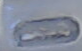

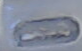

colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


23
35
346
23
35


colour array:  ['Pink', 'Light Orange']
incorrect


23
35
23
35
346


colour array:  ['Light Orange']
incorrect


23
35
23
35
346


colour array:  ['Light Orange']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
346
23
35


colour array:  ['Light Orange']
incorrect


Dark Colour


colour array:  ['Brown']
incorrect


23
35
346
23
35


colour array:  ['Light Orange']
incorrect


Dark Colour


colour array:  ['Brown']
incorrect


23
35
346


colour array:  []
incorrect


Dark Colour


colour array:  ['Brown']
incorrect


colour array:  ['White']
incorrect


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct
colour array:  ['White']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct
colour array:  ['White']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
346
23
35


colour array:  ['Pink', 'Light Orange']
incorrect
colour array:  ['White']
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


23
35
346
23
35


colour array:  ['Pink', 'Light Orange']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
346
23
35


colour array:  ['Light Orange']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
346
23
35


colour array:  ['Pink', 'Light Orange']
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


23
35
23
35
346


colour array:  ['Light Orange']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35
346


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


Dark Colour
Dark Colour


colour array:  ['Brown']
incorrect


23
35
346


colour array:  []
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


Dark Colour


colour array:  ['Brown']
incorrect
colour array:  ['White']
incorrect


Dark Colour


colour array:  ['Brown']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


23
35
346


colour array:  []
incorrect


23
35
346


colour array:  []
incorrect


Dark Colour


colour array:  ['Brown']
incorrect


23
35
346


colour array:  []
incorrect


23
35
346


colour array:  ['Pink']
incorrect
colour array:  ['White']
incorrect


Dark Colour


colour array:  ['Brown']
incorrect


23
35
346


colour array:  ['Pink']
incorrect


23
35
346


colour array:  []
incorrect
colour array:  ['White']
incorrect


23
35
346


colour array:  []
incorrect
colour array:  ['White']
incorrect


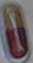

23
35
346


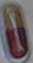

colour array:  []
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


23
35
23
35
346


colour array:  ['Light Orange']
incorrect


23
35
23
35
346


colour array:  ['Light Orange', 'Pink']
incorrect


23
35
346
23
35


colour array:  ['Pink', 'Light Orange']
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


23
35
23
35
346


colour array:  ['Light Orange', 'Pink']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


colour array:  ['White']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
23
35
346


colour array:  ['Light Orange', 'Pink']
incorrect


Dark Colour
23


colour array:  ['Brown', 'Dark Orange']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23


colour array:  ['Brown', 'Dark Orange']
incorrect


23
35
23
35
346


colour array:  ['Light Orange']
incorrect


23
Dark Colour


colour array:  ['Dark Orange', 'Brown']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
346
23
35


colour array:  ['Light Orange']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


Dark Colour
23


colour array:  ['Brown', 'Dark Orange']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


23
35
346
23
35
346


colour array:  []
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour


colour array:  ['Brown']
incorrect


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
23
35
346


colour array:  ['Light Orange']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
Dark Colour


colour array:  ['Light Orange', 'Brown']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
Dark Colour


colour array:  ['Dark Orange', 'Brown']
incorrect


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


Dark Colour
23
35


colour array:  ['Brown', 'Light Orange']
correct


23
35
23
35
346


colour array:  ['Light Orange', 'Pink']
incorrect


23
35
346


colour array:  []
incorrect
correct count:  77
total count:  204
accuracy: 37.745098039215684 %
Pill6


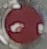

23
35
346


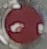

colour array:  ['Pink']
correct


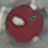

23
35
346


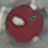

colour array:  ['Pink']
correct


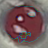

23
35
346


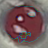

colour array:  ['Pink']
correct


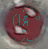

23
35
346


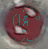

colour array:  []
incorrect


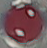

23
35
346


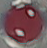

colour array:  ['Pink']
correct


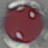

23
35
346


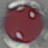

colour array:  ['Pink']
correct


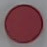

23
35
346


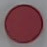

colour array:  ['Pink']
correct


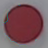

23
35
346


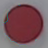

colour array:  ['Pink']
correct


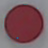

23
35
346


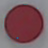

colour array:  ['Pink']
correct


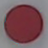

23
35
346


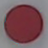

colour array:  ['Pink']
correct


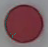

23
35
346


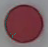

colour array:  ['Pink']
correct


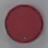

23
35
346


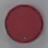

colour array:  ['Pink']
correct


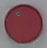

23
35
346


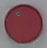

colour array:  ['Pink']
correct


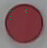

23
35
346


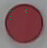

colour array:  ['Pink']
correct


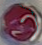

23
35
346


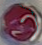

colour array:  []
incorrect


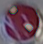

23
35
346


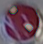

colour array:  []
incorrect


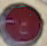

23
35
346


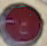

colour array:  ['Pink']
correct


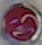

23
35
346


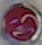

colour array:  ['Pink']
correct


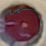

23
35
346


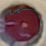

colour array:  []
incorrect


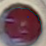

23
35
346


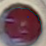

colour array:  []
incorrect


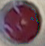

23
35
346


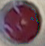

colour array:  []
incorrect


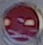

23
35
346


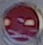

colour array:  []
incorrect


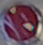

23
35
346


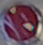

colour array:  []
incorrect


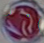

23
35
346


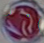

colour array:  []
incorrect
colour array:  ['White']
incorrect


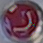

23
35
346


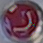

colour array:  ['Pink']
correct


23
35
346
23
35
346


colour array:  []
incorrect


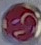

23
35
346


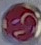

colour array:  ['Pink']
correct


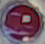

23
35
346


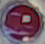

colour array:  []
incorrect


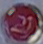

23
35
346


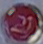

colour array:  ['Pink']
correct


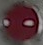

Dark Colour


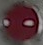

colour array:  ['Brown']
incorrect


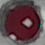

23
35
346


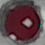

colour array:  ['Pink']
correct


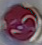

23
35
346


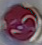

colour array:  []
incorrect


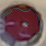

23
35
346


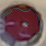

colour array:  []
incorrect


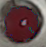

23
35
346


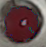

colour array:  ['Pink']
correct


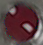

23
35
346


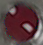

colour array:  ['Pink']
correct


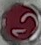

Dark Colour


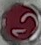

colour array:  ['Brown']
incorrect


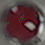

23
35
346
23
35
346


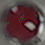

colour array:  ['Pink']
correct


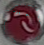

23
35
346


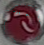

colour array:  ['Pink']
correct


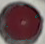

23
35
346


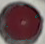

colour array:  ['Pink']
correct


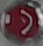

Dark Colour


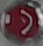

colour array:  ['Brown']
incorrect


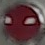

23
35
346
23
35
346


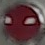

colour array:  ['Pink']
correct


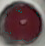

23
35
346
23
35
346


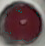

colour array:  ['Pink']
correct


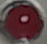

23
35
346
23
35
346


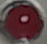

colour array:  ['Pink']
correct


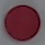

23
35
346


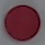

colour array:  ['Pink']
correct


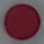

23
35
346


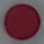

colour array:  ['Pink']
correct


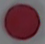

23
35
346


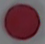

colour array:  ['Pink']
correct


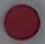

23
35
346


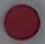

colour array:  ['Pink']
correct


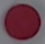

23
35
346


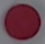

colour array:  ['Pink']
correct


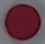

23
35
346


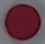

colour array:  ['Pink']
correct


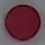

23
35
346


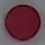

colour array:  ['Pink']
correct


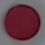

23
35
346


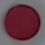

colour array:  ['Pink']
correct


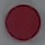

23
35
346


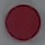

colour array:  ['Pink']
correct


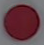

23
35
346


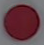

colour array:  ['Pink']
correct


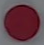

23
35
346


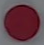

colour array:  ['Pink']
correct


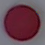

23
35
346


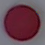

colour array:  ['Pink']
correct


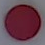

23
35
346


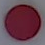

colour array:  ['Pink']
correct


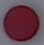

23
35
346
23
35
346


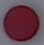

colour array:  ['Pink']
correct


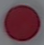

23
35
346


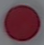

colour array:  ['Pink']
correct


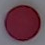

23
35
346


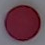

colour array:  ['Pink']
correct


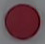

23
35
346


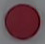

colour array:  ['Pink']
correct


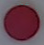

23
35
346


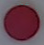

colour array:  ['Pink']
correct


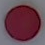

23
35
346


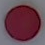

colour array:  ['Pink']
correct


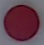

23
35
346


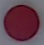

colour array:  ['Pink']
correct


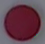

23
35
346
23
35
346


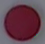

colour array:  ['Pink']
correct


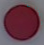

23
35
346


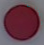

colour array:  ['Pink']
correct


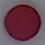

23
35
346


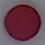

colour array:  ['Pink']
correct


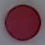

23
35
346


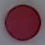

colour array:  ['Pink']
correct


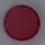

23
35
346


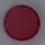

colour array:  ['Pink']
correct


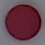

23
35
346


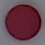

colour array:  ['Pink']
correct
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


colour array:  ['White']
incorrect


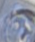

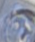

colour array:  ['White']
incorrect


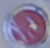

23
35
346


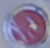

colour array:  []
incorrect


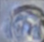

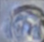

colour array:  ['White']
incorrect


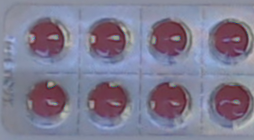

23
35
346


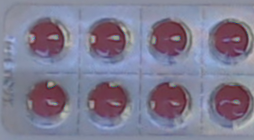

colour array:  []
incorrect


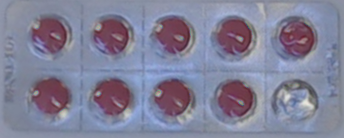

23
35
346


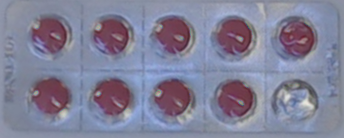

colour array:  []
incorrect


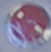

23
35
346


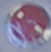

colour array:  []
incorrect


colour array:  ['White']
incorrect


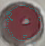

23
35
346


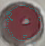

colour array:  ['Pink']
correct


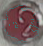

23
35
346


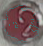

colour array:  ['Pink']
correct


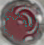

23
35
346


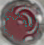

colour array:  ['Pink']
correct


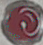

23
35
346


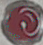

colour array:  ['Pink']
correct


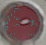

23
35
346


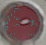

colour array:  ['Pink']
correct


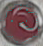

23
35
346


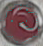

colour array:  ['Pink']
correct


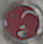

23
35
346


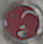

colour array:  ['Pink']
correct


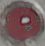

23
35
346
23
35
346


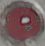

colour array:  []
incorrect


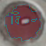

23
35
346
23
35
346


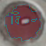

colour array:  ['Pink']
correct


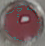

23
35
346


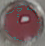

colour array:  ['Pink']
correct


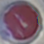

23
35
346


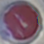

colour array:  []
incorrect


colour array:  ['White']
incorrect


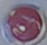

23
35
346


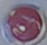

colour array:  []
incorrect


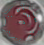

23
35
346


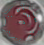

colour array:  ['Pink']
correct


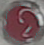

23
35
346


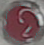

colour array:  ['Pink']
correct


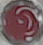

23
35
346


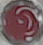

colour array:  ['Pink']
correct


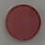

23
35
346
23
35
346


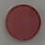

colour array:  []
incorrect


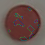

23
35
346
23
35
346


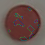

colour array:  []
incorrect


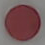

23
35
346
23
35
346


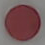

colour array:  []
incorrect


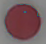

23
35
346


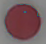

colour array:  ['Pink']
correct


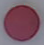

23
35
346


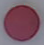

colour array:  ['Pink']
correct


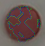

23
35
346
23


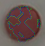

colour array:  ['Dark Orange']
incorrect


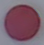

23
35
346


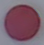

colour array:  ['Pink']
correct


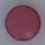

23
35
346


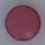

colour array:  ['Pink']
correct


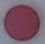

23
35
346


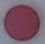

colour array:  ['Pink']
correct


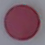

23
35
346


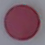

colour array:  ['Pink']
correct


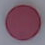

23
35
346


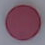

colour array:  ['Pink']
correct


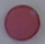

23
35
346


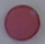

colour array:  ['Pink']
correct


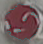

23
35
346


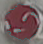

colour array:  ['Pink']
correct


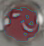

23
35
346


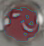

colour array:  ['Pink']
correct
colour array:  ['White']
incorrect


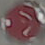

23
35
346


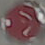

colour array:  ['Pink']
correct


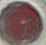

23
35
346


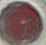

colour array:  []
incorrect


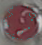

23
35
346


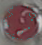

colour array:  ['Pink']
correct


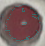

23
35
346


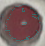

colour array:  ['Pink']
correct


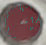

23
35
346


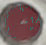

colour array:  ['Pink']
correct


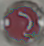

23
35
346


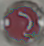

colour array:  ['Pink']
correct
colour array:  ['White']
incorrect


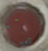

23


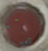

colour array:  ['Dark Orange']
incorrect


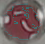

23
35
346


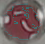

colour array:  ['Pink']
correct
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


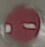

23
35
346
23
35
346


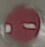

colour array:  []
incorrect


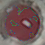

23
35
346
23
35
346


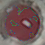

colour array:  ['Pink']
correct


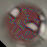

23
35
346
23


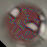

colour array:  ['Dark Orange']
incorrect


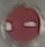

23
35
346
23
35
346


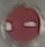

colour array:  []
incorrect
colour array:  ['White']
incorrect


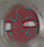

23
35
346
23
35
346


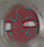

colour array:  []
incorrect


colour array:  ['White']
incorrect


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


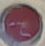

23
35
346


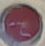

colour array:  ['Pink']
correct
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


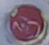

23
35
346


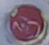

colour array:  []
incorrect
colour array:  ['White']
incorrect


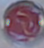

23
35
346


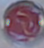

colour array:  []
incorrect
colour array:  ['White']
incorrect


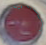

23
35
346


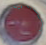

colour array:  ['Pink']
correct


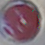

23
35
346


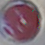

colour array:  ['Pink']
correct


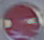

23
35
346


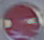

colour array:  []
incorrect


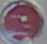

23
35
346


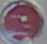

colour array:  []
incorrect


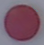

23
35
346


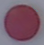

colour array:  ['Pink']
correct


colour array:  ['White']
incorrect


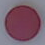

23
35
346


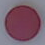

colour array:  ['Pink']
correct


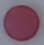

23
35
346


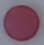

colour array:  ['Pink']
correct


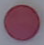

23
35
346


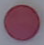

colour array:  ['Pink']
correct


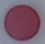

23
35
346


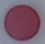

colour array:  ['Pink']
correct
colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


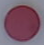

23
35
346


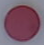

colour array:  ['Pink']
correct


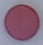

23
35
346


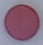

colour array:  []
incorrect


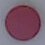

23
35
346


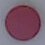

colour array:  ['Pink']
correct


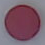

23
35
346


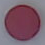

colour array:  ['Pink']
correct


colour array:  ['White']
incorrect
colour array:  ['White']
incorrect


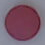

23
35
346


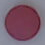

colour array:  ['Pink']
correct


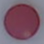

23
35
346


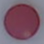

colour array:  ['Pink']
correct


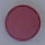

23
35
346


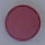

colour array:  ['Pink']
correct


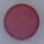

23
35
346


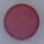

colour array:  []
incorrect


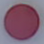

23
35
346


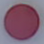

colour array:  []
incorrect


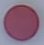

23
35
346


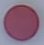

colour array:  []
incorrect


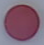

23
35
346


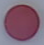

colour array:  ['Pink']
correct


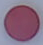

23
35
346


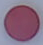

colour array:  []
incorrect


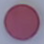

23
35
346


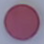

colour array:  []
incorrect


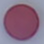

23
35
346


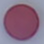

colour array:  []
incorrect


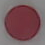

23
35
346


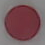

colour array:  ['Pink']
correct


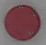

23
35
346


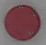

colour array:  ['Pink']
correct


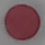

23
35
346


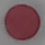

colour array:  ['Pink']
correct


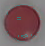

23
35
346


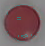

colour array:  ['Pink']
correct


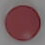

23
35
346


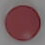

colour array:  ['Pink']
correct


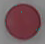

23
35
346


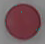

colour array:  ['Pink']
correct


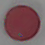

23
35
346


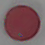

colour array:  ['Pink']
correct


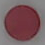

23
35
346


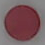

colour array:  ['Pink']
correct


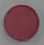

23
35
346


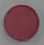

colour array:  ['Pink']
correct


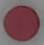

23
35
346


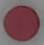

colour array:  ['Pink']
correct


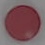

23
35
346


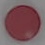

colour array:  ['Pink']
correct


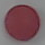

23
35
346


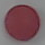

colour array:  ['Pink']
correct


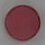

23
35
346


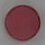

colour array:  ['Pink']
correct


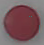

23
35
346


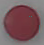

colour array:  ['Pink']
correct


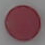

23
35
346


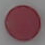

colour array:  ['Pink']
correct


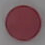

23
35
346


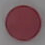

colour array:  ['Pink']
correct


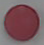

23
35
346


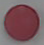

colour array:  ['Pink']
correct


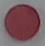

23
35
346


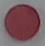

colour array:  ['Pink']
correct


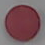

23
35
346


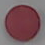

colour array:  ['Pink']
correct


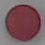

23
35
346


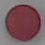

colour array:  ['Pink']
correct


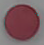

23
35
346


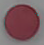

colour array:  ['Pink']
correct


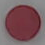

23
35
346


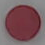

colour array:  ['Pink']
correct


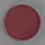

23
35
346


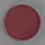

colour array:  ['Pink']
correct
correct count:  120
total count:  195
accuracy: 61.53846153846154 %


In [41]:
#testing images
DATA_PATH='./gdrive/My Drive/Career Work/SERIUS/Pill Images V2/Train Set'
shape=['Circular','Elliptical']
#if we have whte on white (eg. pill3), unabe to extract contour
#original dimensions are 2500 x 3500
count=0
accuracy_array=[None]*len(medication_array)

for pill in medication_array:
  
  my_path=os.path.join(DATA_PATH,pill)
  classnum=medication_array.index(pill) #indexed from 0 to 5 (will add one when showing results)

  pillAccuracy=accuracy()
  print(pill)
  
  for image in os.listdir(my_path):
    img_array=cv2.imread(os.path.join(my_path,image))
    #cv2_imshow(img_array)
  #   try
    pillAccuracy.total_image_count+=1
#     if classnum==4:
#       process_image(img_array,250,classnum,3)
#     else:
    myPill,colour_array=process_image(img_array,250,classnum,3)
  
    print('colour array: ',colour_array)
    if colour_correct(colour_array,medication_array.index(pill)):
      pillAccuracy.correct_image_count+=1
      print('correct')
     
    else:
      print('incorrect')

  #   except:
  #     print('f')
  #     break
    count=count+1

#   if count == 55:
#     break

  pillAccuracy.accuracy=float(pillAccuracy.correct_image_count)/float(pillAccuracy.total_image_count)
  accuracy_array[classnum]=pillAccuracy.accuracy
  print('correct count: ', pillAccuracy.correct_image_count)
  print('total count: ', pillAccuracy.total_image_count)
  print('accuracy:', pillAccuracy.accuracy*100,'%')
  



In [43]:
print('Overall Accuracy: ',100*sum(accuracy_array)/len(medication_array),'%')


Overall Accuracy:  67.52061688712892 %


Pill1


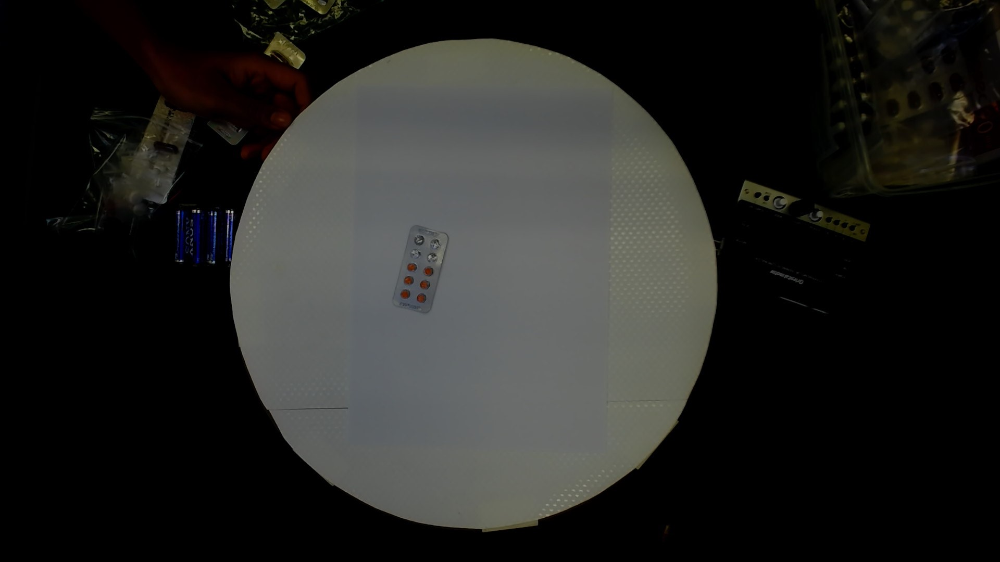

hsv_colors [array([  8.80516899, 169.71371769,  79.25049702]), array([93.91260841, 26.22281521, 81.70313542])]
hsv reg final [[17.610337972168097, 66.55439909562185, 31.07862628152652], [187.82521681120926, 10.283456945152611, 32.040445264163004]]
hsv reg [[17.610337972168097, 66.55439909562185, 31.07862628152652], [187.82521681120926, 10.283456945152611, 32.040445264163004]]
colours [[17.610337972168097, 66.55439909562185, 31.07862628152652], [187.82521681120926, 10.283456945152611, 32.040445264163004]]
hsv colours [[17.610337972168097, 66.55439909562185, 31.07862628152652], [187.82521681120926, 10.283456945152611, 32.040445264163004]]


TypeError: ignored

In [0]:
#test individuals 
DATA_PATH='./gdrive/My Drive/Career Work/SERIUS/Individual Test'
shape=['Circular','Elliptical']
#if we have whte on white (eg. pill3), unabe to extract contour
#original dimensions are 2500 x 3500
count=0
accuracy_array=[None]*len(medication_array)

classnum=0
pillAccuracy=accuracy()
print(pill)

for image in os.listdir(DATA_PATH):
  img_array=cv2.imread(os.path.join(DATA_PATH,image))
  cv2_imshow(img_array)
#   try
  pillAccuracy.total_image_count+=1
  process_image(img_array,250,classnum,2)

#   except:
#     print('f')
#     break
  count=count+1

#   if count == 55:
#     break

  pillAccuracy.accuracy=float(pillAccuracy.correct_image_count)/float(pillAccuracy.total_image_count)
  accuracy_array[classnum]=pillAccuracy.accuracy
  print('correct count: ', pillAccuracy.correct_image_count)
  print('total count: ', pillAccuracy.total_image_count)
  print('accuracy:', pillAccuracy.accuracy*100,'%')